[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/1YC3sONhRCoaBq-wGqdjP7GEpAlXXI1Ng?usp=sharing)

In [1]:
import torch.nn as nn
import torch
import torchaudio
import seaborn as sns

import pandas as pd
import numpy as np
from IPython import display

In [2]:
from drive.MyDrive.HSE.thesis.utils.demucs_logs_plot import plot_logs

In [ ]:
# Path to the training logs on cluster: /home/dadyatlova_1/russian_speech_denoiser/denoiser/outputs/exp_/trainer.log
# Data path: /home/dadyatlova_1/russian_speech_denoiser/DNS-Challenge/datasets/training_set_jan14_min35_10_40h/
# Noisy data creation config path: /home/dadyatlova_1/russian_speech_denoiser/DNS-Challenge/noisyspeech_synthesizer.cfg 

In [3]:
# Test audio samples:
samples_directory_exp_jan14 = "/content/drive/MyDrive/HSE/thesis/samples_jan16/"
samples_directory_exp_jan21 = "/content/drive/MyDrive/HSE/thesis/samples_jan21/"
samples_directory_exp_dtln = "/content/drive/MyDrive/HSE/thesis/exp_dtln"
sample_rate = 16_000

# Clean Audio 

In [ ]:
noisy_wav_min_15 = torchaudio.load(samples_directory_exp_jan14 + "min_15/noisy_0.wav")[0].squeeze()
display.display(display.Audio(noisy_wav_min_15, rate=sample_rate))

# Noisy Audio

### SNR -15

In [ ]:
noisy_wav_min_30 = torchaudio.load(samples_directory_exp_jan14 + "min_15/noisy_0.wav")[0].squeeze()
display.display(display.Audio(noisy_wav_min_30, rate=sample_rate))

### SNR -30

In [ ]:
noisy_wav_min_30 = torchaudio.load(samples_directory_exp_jan14 + "min_30/noisy_0.wav")[0].squeeze()
display.display(display.Audio(noisy_wav_min_30, rate=sample_rate))

# Before finetuning 
(run denoiser: demucs 48 hidden on the same samples before training)

### SNR -15

Enhanced audio:

In [ ]:
noisy_wav_min_15_enhc_no_fnt = torchaudio.load(samples_directory_exp_jan14 + "min_15/enhanced_no_finetune.wav")[0].squeeze()
display.display(display.Audio(noisy_wav_min_15_enhc_no_fnt, rate=sample_rate))

### SNR -30

Enhanced audio: 

In [ ]:
enhanced_wav_min_30_enhc_no_fnt = torchaudio.load(samples_directory_exp_jan14 + "min_30/enhanced_no_finetune.wav")[0].squeeze()
display.display(display.Audio(enhanced_wav_min_30_enhc_no_fnt, rate=sample_rate))

**Conlusion:** as expected bad quality (originally demucs trained on audio with SNR levels [-5, 35])

---



## After finetuning

**Model:** pretrained Demucs (48 hidden).

**Training details:** 

*   60 epochs;
*   1 gpu;
* 24 hours;
* 64 bs.




**Dataset:** 40 hours:

  *   28 hours (train);
  *   4 hours (val);
  * 8 hours (test).



**PESQ (val):** 2.9.

**STOI (val):** 0.9.

### Clean audio

After enhancement:

In [ ]:
clean_wav_enhanced = torchaudio.load(samples_directory_exp_jan14 + "min_15/clean_fileid_0_enhanced.wav")[0].squeeze()
display.display(display.Audio(clean_wav_enhanced, rate=sample_rate))

### SNR -15

Enhanced audio:

In [ ]:
enhanced_wav_min_15 = torchaudio.load(samples_directory_exp_jan14 + "min_15/enhanced_0.wav")[0].squeeze()
display.display(display.Audio(enhanced_wav_min_15, rate=sample_rate))

### SNR -30

Enhanced audio:

In [ ]:
enhanced_wav_min_30 = torchaudio.load(samples_directory_exp_jan14 + "min_30/enhanced_0.wav")[0].squeeze()
display.display(display.Audio(enhanced_wav_min_30, rate=sample_rate))

**Conlusion:** some artefacts were left but reached PESQ 2.9 like in the paper.

# Training logs analysis

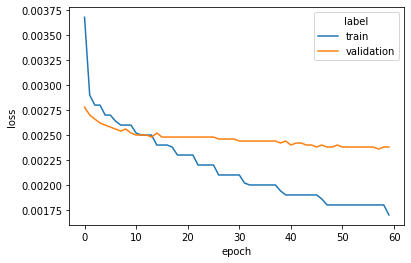

In [ ]:
plot_logs("/content/drive/MyDrive/HSE/thesis/samples_jan16/logs/trainer.log", 60)

finetune Demucs (64 hidden) results

**Model:** pretrained Demucs (64 hidden).

**Training details:** 

* 60 epochs;
* 1 gpu;
* 24 hours;
* 64 bs.




**Dataset:** 40 hours:

  * 28 hours (train);
  * 4 hours (val);
  * 8 hours (test).



**PESQ (val):** 1.10

**STOI (val):** 0.64

### Clean audio

Clean Enhanced:

In [ ]:
clean_wav_enhanced = torchaudio.load(samples_directory_exp_jan21 + "enhanced/clean_fileid_0_noisy_enhanced.wav")[0].squeeze()
display.display(display.Audio(clean_wav_enhanced, rate=sample_rate))

### SNR -15

Enhanced:

In [ ]:
clean_wav_enhanced = torchaudio.load(samples_directory_exp_jan21 + "enhanced/noisy_0_snr_min15_enhanced.wav")[0].squeeze()
display.display(display.Audio(clean_wav_enhanced, rate=sample_rate))

### SNR -30

Enhanced:

In [ ]:
clean_wav_enhanced = torchaudio.load(samples_directory_exp_jan21 + "enhanced/noisy_0_snr_min30_enhanced.wav")[0].squeeze()
display.display(display.Audio(clean_wav_enhanced, rate=sample_rate))

**Conlusion:** with the same training setup as 48-hid model 64-h demucs showed worse results. As the graphic of loss shows the model gets on plato faster and loss starts growing on evaluation. It makes sense to train model for 10 epochs only.

# Training logs analysis

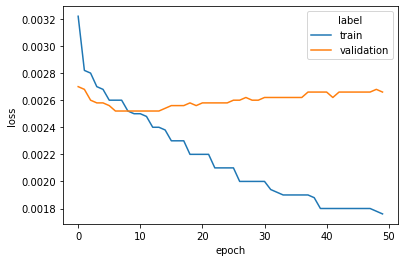

In [ ]:
plot_logs("/content/drive/MyDrive/HSE/thesis/samples_ jan21/logs/trainer.log", 50)

#DTLN


**No finetuning model.h5**:

#### Clean Audio Enhanced

In [5]:
clean_wav_enhanced = torchaudio.load(samples_directory_exp_dtln + "/enhanced_no_finetuning/clean_fileid_0_noisy.wav")[0].squeeze()
display.display(display.Audio(clean_wav_enhanced, rate=sample_rate))

#### -15 SNR Audio Enhanced

In [6]:
clean_wav_enhanced = torchaudio.load(samples_directory_exp_dtln + "/enhanced_no_finetuning/noisy_0_snr_min15.wav")[0].squeeze()
display.display(display.Audio(clean_wav_enhanced, rate=sample_rate))

#### -30 SNR Audio Enhanced

In [7]:
clean_wav_enhanced = torchaudio.load(samples_directory_exp_dtln + "/enhanced_no_finetuning/noisy_0_snr_min30.wav")[0].squeeze()
display.display(display.Audio(clean_wav_enhanced, rate=sample_rate))

**Finetuned DTLN**:

- pretrained **model.h5**
- epochs: 70
- bs: 32

#### Clean Audio Enhanced

In [10]:
clean_wav_enhanced = torchaudio.load(samples_directory_exp_dtln + "/enhanced_pretrained/clean_fileid_0_noisy.wav")[0].squeeze()
display.display(display.Audio(clean_wav_enhanced, rate=sample_rate))

#### -15 SNR Audio Enhanced

In [9]:
clean_wav_enhanced = torchaudio.load(samples_directory_exp_dtln + "/enhanced_pretrained/noisy_0_snr_min15.wav")[0].squeeze()
display.display(display.Audio(clean_wav_enhanced, rate=sample_rate))

#### -30 SNR Audio Enhanced

In [11]:
clean_wav_enhanced = torchaudio.load(samples_directory_exp_dtln + "/enhanced_pretrained/noisy_0_snr_min30.wav")[0].squeeze()
display.display(display.Audio(clean_wav_enhanced, rate=sample_rate))